# 답변에 이미지도 함께 표시하는 예제
https://github.com/jesamkim/sct_traiding_poc/blob/main/71_summarization_and_results_w_imgs.ipynb

In [3]:
# 필요한 라이브러리 설치

!pip install langchain langchain_aws faiss-cpu pymupdf4llm pillow boto3 -q -U

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
awscli 1.32.84 requires botocore==1.34.84, but you have botocore 1.34.150 which is incompatible.


In [4]:
# 필요한 모듈 임포트

import os
import shutil
import time
import base64

import boto3

import pymupdf4llm # pdf의 텍스트 및 이미지를 추출할 parser

from langchain_aws import ChatBedrock
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain.embeddings import BedrockEmbeddings
from langchain.vectorstores import FAISS
from langchain.chains import RetrievalQA
from langchain.document_loaders import TextLoader
import pathlib
import re
from IPython.display import display, Image, Markdown

In [5]:
# PDF 파싱 결과(md 및 이미지)를 저장할 ./temp 디렉토리 설정

def manage_temp_directory():
    temp_dir = "./temp"

    # 디렉토리가 존재하는지 확인
    if os.path.exists(temp_dir):
        print(f"{temp_dir} 디렉토리가 이미 존재합니다.")

        # 디렉토리 내의 모든 파일 삭제
        for filename in os.listdir(temp_dir):
            file_path = os.path.join(temp_dir, filename)
            try:
                if os.path.isfile(file_path) or os.path.islink(file_path):
                    os.unlink(file_path)
                elif os.path.isdir(file_path):
                    shutil.rmtree(file_path)
            except Exception as e:
                print(f"Failed to delete {file_path}. Reason: {e}")

        print(f"{temp_dir} 디렉토리 내의 모든 파일이 삭제되었습니다.")
    else:
        # 디렉토리가 없으면 생성
        os.makedirs(temp_dir)
        print(f"{temp_dir} 디렉토리가 생성되었습니다.")

# 함수 실행
manage_temp_directory()

./temp 디렉토리가 생성되었습니다.


In [8]:
%%time

# PDF 파일 경로
pdf_path = "./sample.pdf"

# 임시 디렉토리 생성
temp_dir = pathlib.Path("./temp")
temp_dir.mkdir(exist_ok=True)

# PDF를 마크다운으로 변환 (텍스트와 이미지 포함)
md_text = pymupdf4llm.to_markdown(pdf_path, write_images=True)

# 결과를 파일로 저장
output_path = temp_dir / "output.md"
output_path.write_text(md_text, encoding="utf-8")

# 이미지 파일들을 temp 디렉토리로 이동
pdf_name = pathlib.Path(pdf_path).stem
for file in pathlib.Path().glob(f"{pdf_name}*.png"):
    shutil.move(str(file), str(temp_dir / file.name))

print(f"마크다운 파일이 {output_path.absolute()}에 저장되었습니다.")
print(f"이미지 파일들이 {temp_dir.absolute()} 디렉토리로 이동되었습니다.")

마크다운 파일이 /root/temp/output.md에 저장되었습니다.
이미지 파일들이 /root/temp 디렉토리로 이동되었습니다.
CPU times: user 12.5 s, sys: 439 ms, total: 12.9 s
Wall time: 19.2 s


In [9]:
# 문서를 벡터라이즈

# 마크다운 파일 로드
loader = TextLoader("./temp/output.md", encoding="utf-8")
documents = loader.load()

# 텍스트 분할
text_splitter = RecursiveCharacterTextSplitter(
    chunk_size=1000,
    chunk_overlap=200,
    length_function=len,
)
splits = text_splitter.split_documents(documents)

In [10]:
%%time

# 임베딩 생성 및 벡터 스토어 구축
embeddings = BedrockEmbeddings(model_id="amazon.titan-embed-text-v1")
vectorstore = FAISS.from_documents(splits, embeddings)

CPU times: user 180 ms, sys: 34.9 ms, total: 215 ms
Wall time: 9.92 s


In [11]:
# ChatBedrock 초기화 (Claude 3 Sonnet 모델 사용)
llm = ChatBedrock(
    #model_id="anthropic.claude-3-5-sonnet-20240620-v1:0" # Claude 3.5 Sonnet
    model_id="anthropic.claude-3-sonnet-20240229-v1:0" # Claude 3 Sonnet
)

# RetrievalQA 체인 설정
qa_chain = RetrievalQA.from_chain_type(
    llm=llm,
    chain_type="stuff",
    retriever=vectorstore.as_retriever(),
    return_source_documents=True,
)

In [16]:
# 이미지 파일 경로 추출 함수
def extract_image_paths(text):
    return re.findall(r'!\[.*?\]\((.*?\.png)\)', text)

# 질의 응답 함수
def ask_question(question):
    result = qa_chain({"query": question})
    answer = result["result"]
    source_docs = result["source_documents"]

    # 관련 이미지 파일 경로 추출
    image_paths = []
    for i, doc in enumerate(source_docs):
        print(f"source_docs[{i}]: {doc}\n\n")
        image_paths.extend(extract_image_paths(doc.page_content))

    return answer, list(set(image_paths))  # 중복 제거

# 질문 및 답변 출력 함수
def print_qa_with_images(question):
    answer, image_paths = ask_question(question)

    print(f"질문: {question}")
    print(f"답변: {answer}")

    if image_paths:
        print("\n관련 이미지:")
        for path in image_paths:
            full_path = pathlib.Path("./temp") / path
            if full_path.exists():
                display(Image(filename=str(full_path)))
            else:
                print(f"이미지 파일을 찾을 수 없습니다: {path}")
    else:
        print("\n관련 이미지가 없습니다.")

source_docs[0]: page_content='-----

##### Demo: Automatic subtitling of VOD content

“We selected Amazon Transcribe to power the
captioning of NASCAR’s VOD content on our
multi-site website, spanning 195 countries and 29
languages. Since implementing Amazon
**Transcribe, we automatically add captions to**
**99% of our VOD content and spend 97% less**
**than what we had originally estimated.”**

-Patrick Carroll, Senior Director of Development, NASCAR


![](sample.pdf-30-1.png)

-----

![](sample.pdf-31-0.png)

#### Medical transcriptions


-----

##### Common industry challenges

Medical terminology accuracy

![](sample.pdf-32-1.png)

Security and privacy concerns

![](sample.pdf-32-2.png)

Clinical documentation takes too long


-----

##### Transcribe Medical Features


![](sample.pdf-33-1.png)

![](sample.pdf-33-2.png)

Telehealth & Dictation

Transcribe, store, and

review patient/clinician

communication and

dictations.


Medical Specialties

Transcription expertise for

primary

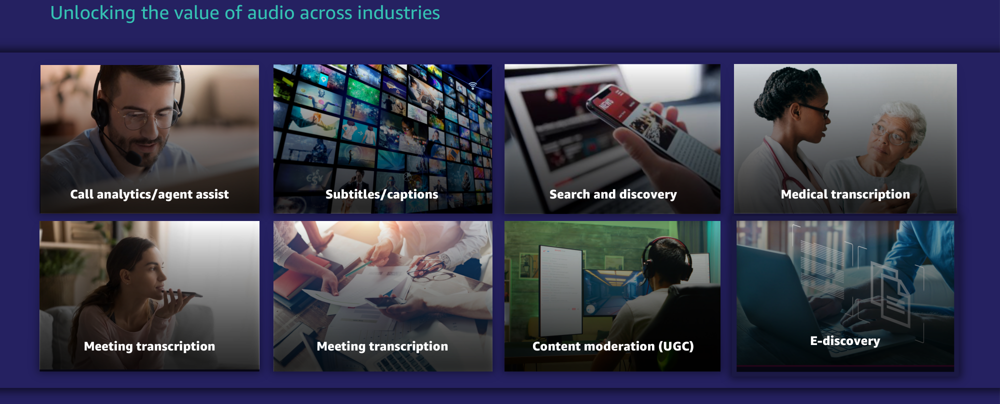

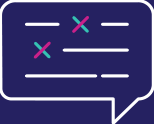

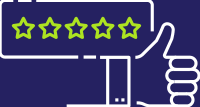

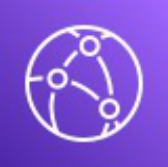

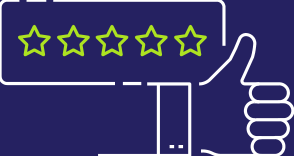

...

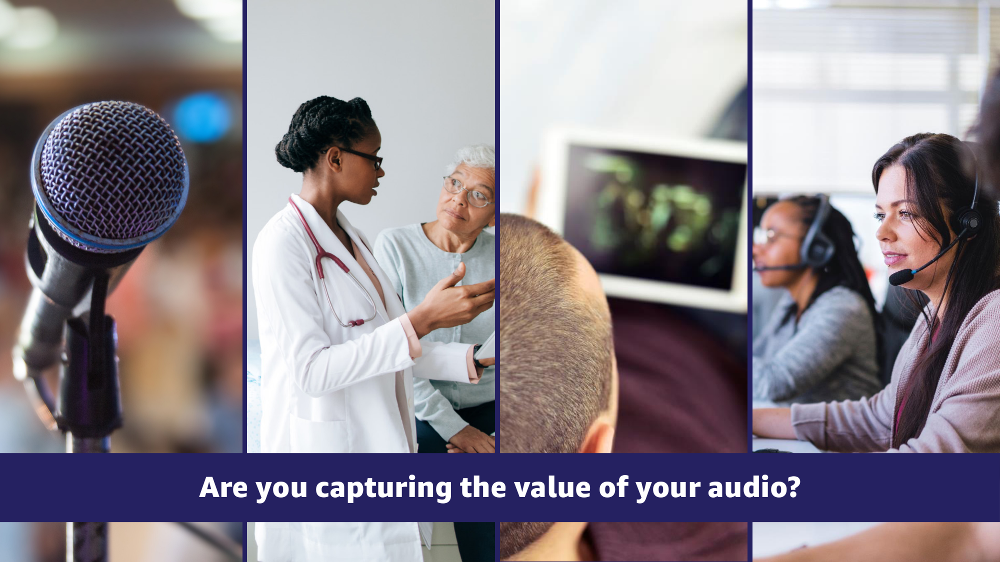

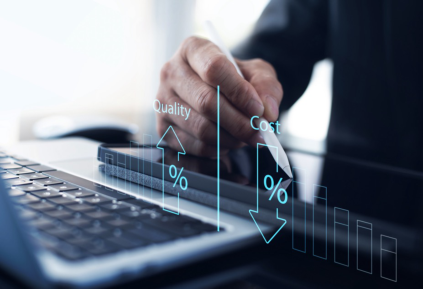

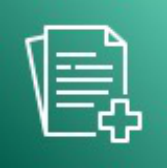

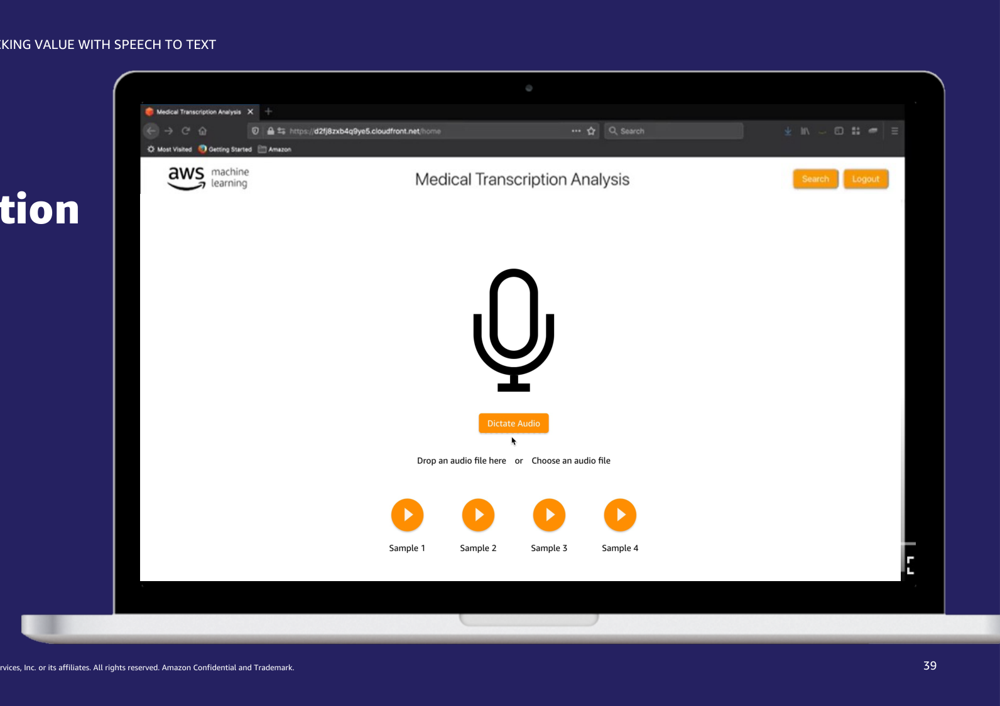

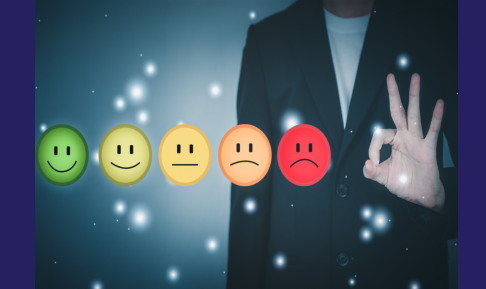



CPU times: user 407 ms, sys: 20.1 ms, total: 428 ms
Wall time: 8.64 s


In [17]:
%%time

# 사용자 쿼리
query = """
How transcribe is works?
"""
print_qa_with_images(query)

print("\n" + "="*50 + "\n")

#print_qa_with_images("문서에 포함된 이미지들에 대해 설명해주세요.") # 첨부된 이미지에 대한 추가 설명을 요청함